In [ ]:
# !pip install roboflow

  Using cached roboflow-1.2.13-py3-none-any.whl.metadata (9.7 kB)
  Using cached matplotlib-3.10.8-cp312-cp312-win_amd64.whl.metadata (52 kB)
  Using cached requests_toolbelt-1.0.0-py2.py3-none-any.whl.metadata (14 kB)
  Using cached contourpy-1.3.3-cp312-cp312-win_amd64.whl.metadata (5.5 kB)
Using cached roboflow-1.2.13-py3-none-any.whl (91 kB)
Using cached matplotlib-3.10.8-cp312-cp312-win_amd64.whl (8.1 MB)
Using cached contourpy-1.3.3-cp312-cp312-win_amd64.whl (226 kB)
Using cached requests_toolbelt-1.0.0-py2.py3-none-any.whl (54 kB)

   ---------------------------------------- 0/4 [contourpy]
   ---------- ----------------------------- 1/4 [requests-toolbelt]
   ---------- ----------------------------- 1/4 [requests-toolbelt]
   ---------- ----------------------------- 1/4 [requests-toolbelt]
   -------------------- ------------------- 2/4 [matplotlib]
   -------------------- ------------------- 2/4 [matplotlib]
   -------------------- ------------------- 2/4 [matplotlib]
   -----

In [3]:
from roboflow import Roboflow
rf = Roboflow(api_key="SxzolWGk5Mtaj43h7V3G")
project = rf.workspace("teguhpermana").project("ptnbpr")
version = project.version(2)
dataset = version.download("coco-segmentation")
                

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PTNBPR-2 in coco-segmentation:: 100%|██████████| 52/52 [00:00<00:00, 1412.98it/s]


In [4]:
import json
import os
import shutil

def convert_coco_json_to_yolo_segmentation(json_file, output_folder, image_folder_name='train'):
    # Buka file JSON
    with open(json_file) as f:
        data = json.load(f)
    
    # Buat folder labels output jika belum ada
    labels_dir = os.path.join(output_folder, image_folder_name, 'labels')
    os.makedirs(labels_dir, exist_ok=True)
    
    # Mapping image_id ke info gambar (filename, width, height)
    images = {img['id']: img for img in data['images']}
    
    # Mapping category_id dari COCO ke index 0,1,2,3... untuk YOLO
    # Pastikan urutan ini sesuai dengan keinginan Anda (asbestos, concrete, dll)
    # Biasanya Roboflow mengurutkan berdasarkan abjad atau ID creation
    cat_mapping = {cat['id']: i for i, cat in enumerate(data['categories'])}
    
    print(f"Mengonversi {len(data['annotations'])} anotsi ke folder: {labels_dir}")
    
    for ann in data['annotations']:
        img_id = ann['image_id']
        img_info = images.get(img_id)
        
        if not img_info: continue

        w, h = img_info['width'], img_info['height']
        cat_id = cat_mapping[ann['category_id']]
        
        # Ambil segmentasi (poligon)
        # Format COCO: [[x1, y1, x2, y2, ...]] (nested list)
        if 'segmentation' in ann and len(ann['segmentation']) > 0:
            for segment in ann['segmentation']:
                # Normalisasi koordinat (0.0 - 1.0)
                # YOLO format: class x1_norm y1_norm x2_norm y2_norm ...
                normalized_coords = []
                for i in range(0, len(segment), 2):
                    x = segment[i] / w
                    y = segment[i+1] / h
                    normalized_coords.extend([x, y])
                
                # Buat string baris
                label_line = f"{cat_id} " + " ".join(map(str, normalized_coords)) + "\n"
                
                # Simpan ke file .txt (nama file sama dengan nama gambar, ganti ekstensi)
                filename_base = os.path.splitext(img_info['file_name'])[0]
                txt_path = os.path.join(labels_dir, f"{filename_base}.txt")
                
                with open(txt_path, 'a') as f_out:
                    f_out.write(label_line)

    # Return list nama class untuk bikin data.yaml nanti
    return [cat['name'] for cat in data['categories']]

# --- EKSEKUSI KONVERSI ---
# Asumsi struktur download Roboflow biasanya:
# dataset.location/
#    train/
#       _annotations.coco.json
#       image1.jpg ...
#    valid/ ...

for split in ['train', 'valid', 'test']:
    json_path = f"{dataset.location}/{split}/_annotations.coco.json"
    if os.path.exists(json_path):
        print(f"Processing {split}...")
        class_names = convert_coco_json_to_yolo_segmentation(json_path, dataset.location, split)
    else:
        print(f"Tidak menemukan JSON di {split}, skip.")

Processing train...
Mengonversi 2675 anotsi ke folder: c:\Bisnis AI\Peta ATRBPN\PTNBPR-2\train\labels
Tidak menemukan JSON di valid, skip.
Tidak menemukan JSON di test, skip.


In [7]:
import os
import shutil
import random
import yaml
import json
from ultralytics import YOLO

# --- CONFIG ---
dataset_path = r"c:\Bisnis AI\Peta ATRBPN\PTNBPR-2" 

# --- DAFTAR KELAS YANG BENAR (HARDCODE AGAR AMAN) ---
# Kita tentukan urutan manual agar 'objects' tidak ikut campur
TARGET_CLASSES = [
    'asbestos_roof', 
    'concrete_tile_roof', 
    'metal_sheet_roof', 
    'roof_temple_black'
]
print(f"Target Kelas: {TARGET_CLASSES}")

# --- LANGKAH 0: BERSIH-BERSIH (RESET) ---
# Hapus folder labels dan valid lama agar tidak duplikat/bentrok
print("Membersihkan folder lama...")
if os.path.exists(os.path.join(dataset_path, "train", "labels")):
    shutil.rmtree(os.path.join(dataset_path, "train", "labels"))
if os.path.exists(os.path.join(dataset_path, "valid")):
    shutil.rmtree(os.path.join(dataset_path, "valid"))
# Hapus file yaml lama
if os.path.exists(os.path.join(dataset_path, "final_data.yaml")):
    os.remove(os.path.join(dataset_path, "final_data.yaml"))

# --- LANGKAH 1: CONVERT DENGAN FILTER ---
json_path = os.path.join(dataset_path, "train", "_annotations.coco.json")
output_train_dir = os.path.join(dataset_path, "train")
train_labels_dir = os.path.join(output_train_dir, 'labels')
os.makedirs(train_labels_dir, exist_ok=True)

with open(json_path) as f:
    data = json.load(f)

# Buat mapping ID dari JSON ke ID YOLO (0-3)
# Hanya ambil jika nama category ada di TARGET_CLASSES
coco_id_to_yolo_id = {}
for cat in data['categories']:
    if cat['name'] in TARGET_CLASSES:
        # Cari index di list TARGET_CLASSES (0, 1, 2, atau 3)
        yolo_id = TARGET_CLASSES.index(cat['name'])
        coco_id_to_yolo_id[cat['id']] = yolo_id

print(f"Mapping ID Valid: {coco_id_to_yolo_id}") 
# Jika 'objects' punya ID di JSON, dia tidak akan masuk ke mapping ini (terfilter)

images = {img['id']: img for img in data['images']}

print("Mengonversi ulang label (hanya 4 kelas)...")
for ann in data['annotations']:
    # Skip jika kategori 'objects' (tidak ada di mapping)
    if ann['category_id'] not in coco_id_to_yolo_id:
        continue
        
    img_id = ann['image_id']
    img_info = images.get(img_id)
    if not img_info: continue

    w, h = img_info['width'], img_info['height']
    yolo_class_id = coco_id_to_yolo_id[ann['category_id']]
    
    if 'segmentation' in ann and len(ann['segmentation']) > 0:
        for segment in ann['segmentation']:
            normalized_coords = []
            for i in range(0, len(segment), 2):
                x = segment[i] / w
                y = segment[i+1] / h
                normalized_coords.extend([x, y])
            
            label_line = f"{yolo_class_id} " + " ".join(map(str, normalized_coords)) + "\n"
            
            filename_base = os.path.splitext(img_info['file_name'])[0]
            txt_path = os.path.join(train_labels_dir, f"{filename_base}.txt")
            
            with open(txt_path, 'a') as f_out:
                f_out.write(label_line)

# --- LANGKAH 2: MERAPIKAN GAMBAR ---
# Pindahkan gambar ke folder images (jika belum)
train_img_dir = os.path.join(dataset_path, "train", "images")
os.makedirs(train_img_dir, exist_ok=True)

for f in os.listdir(output_train_dir):
    if f.lower().endswith(('.jpg', '.jpeg', '.png')):
        shutil.move(os.path.join(output_train_dir, f), os.path.join(train_img_dir, f))

# --- LANGKAH 3: SPLIT DATA KE VALID (20%) ---
print("Membuat set Validasi...")
val_root = os.path.join(dataset_path, "valid")
val_img_dir = os.path.join(val_root, "images")
val_lbl_dir = os.path.join(val_root, "labels")
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(val_lbl_dir, exist_ok=True)

all_images = [f for f in os.listdir(train_img_dir) if f.lower().endswith(('.jpg', '.png'))]
num_val = int(len(all_images) * 0.2)
val_files = random.sample(all_images, num_val)

for img_file in val_files:
    # Pindahkan Gambar
    shutil.move(os.path.join(train_img_dir, img_file), os.path.join(val_img_dir, img_file))
    # Pindahkan Label txt
    base_name = os.path.splitext(img_file)[0]
    txt_name = base_name + ".txt"
    src_lbl = os.path.join(train_labels_dir, txt_name)
    if os.path.exists(src_lbl):
        shutil.move(src_lbl, os.path.join(val_lbl_dir, txt_name))

# --- LANGKAH 4: BUAT FILE CONFIG (DATA.YAML) ---
# Kita pakai TARGET_CLASSES yang bersih
yaml_content = {
    'path': dataset_path,
    'train': 'train/images',
    'val': 'valid/images',
    'nc': len(TARGET_CLASSES),
    'names': {i: name for i, name in enumerate(TARGET_CLASSES)}
}

yaml_path = os.path.join(dataset_path, "final_data.yaml")
with open(yaml_path, 'w') as f:
    yaml.dump(yaml_content, f)

print(f"File YAML Fix (4 Kelas): {yaml_path}")

# --- LANGKAH 5: START TRAINING ---
print("\nMulai Training (Fix Class)...")
model = YOLO('yolov8n-seg.pt')

results = model.train(
    data=yaml_path,
    epochs=50,
    imgsz=640,
    batch=16,
    name='genteng_fix_class'
)

Target Kelas: ['asbestos_roof', 'concrete_tile_roof', 'metal_sheet_roof', 'roof_temple_black']
Membersihkan folder lama...
Mapping ID Valid: {1: 0, 2: 1, 3: 2, 4: 3}
Mengonversi ulang label (hanya 4 kelas)...
Membuat set Validasi...
File YAML Fix (4 Kelas): c:\Bisnis AI\Peta ATRBPN\PTNBPR-2\final_data.yaml

Mulai Training (Fix Class)...
Ultralytics 8.4.10  Python-3.12.7 torch-2.10.0+cpu CPU (Intel Core i5-10400F 2.90GHz)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Bisnis AI\Peta ATRBPN\PTNBPR-2\final_data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False


image 1/1 C:\Bisnis AI\Peta ATRBPN\PTNBPR-2\valid\images\15_jpeg.rf.2e0998f8f6cdcb1dcfd6e2f3ea7df134.jpg: 256x640 15 concrete_tile_roofs, 6 metal_sheet_roofs, 42.1ms
Speed: 1.3ms preprocess, 42.1ms inference, 10.4ms postprocess per image at shape (1, 3, 256, 640)


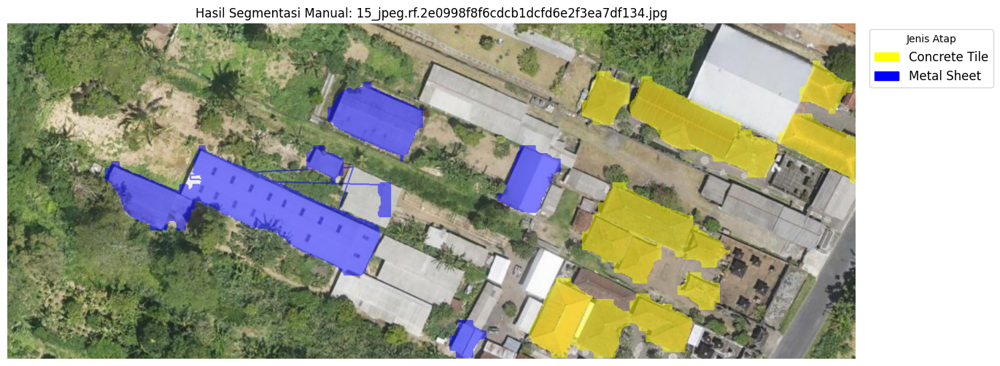


image 1/1 C:\Bisnis AI\Peta ATRBPN\PTNBPR-2\valid\images\1_jpeg.rf.67db5c9e592c721ac154211cdec4e2d8.jpg: 256x640 1 asbestos_roof, 41 concrete_tile_roofs, 3 metal_sheet_roofs, 79.0ms
Speed: 1.5ms preprocess, 79.0ms inference, 31.0ms postprocess per image at shape (1, 3, 256, 640)


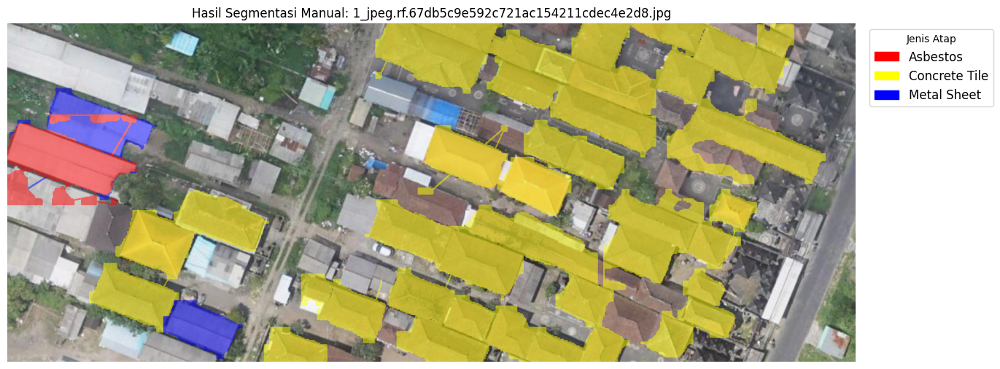


image 1/1 C:\Bisnis AI\Peta ATRBPN\PTNBPR-2\valid\images\20_jpeg.rf.219041c8b9e8b34d8979b203ba245c73.jpg: 256x640 3 concrete_tile_roofs, 4 metal_sheet_roofs, 47.5ms
Speed: 1.7ms preprocess, 47.5ms inference, 4.3ms postprocess per image at shape (1, 3, 256, 640)


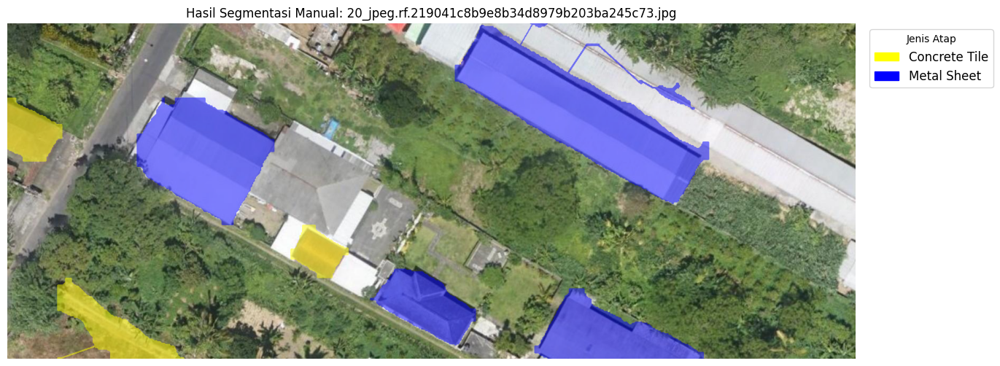


image 1/1 C:\Bisnis AI\Peta ATRBPN\PTNBPR-2\valid\images\33_jpeg.rf.974613cee047cdccfe04e14ae0cb3b57.jpg: 288x640 14 concrete_tile_roofs, 12 metal_sheet_roofs, 44.1ms
Speed: 1.4ms preprocess, 44.1ms inference, 41.2ms postprocess per image at shape (1, 3, 288, 640)


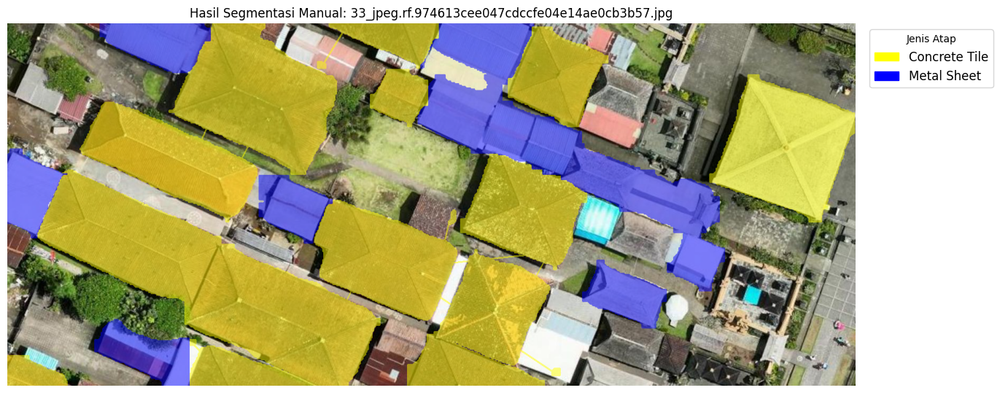


image 1/1 C:\Bisnis AI\Peta ATRBPN\PTNBPR-2\valid\images\37_jpeg.rf.398e85611b5c98a870d8febfdd65505a.jpg: 352x640 15 concrete_tile_roofs, 6 metal_sheet_roofs, 53.6ms
Speed: 3.1ms preprocess, 53.6ms inference, 19.4ms postprocess per image at shape (1, 3, 352, 640)


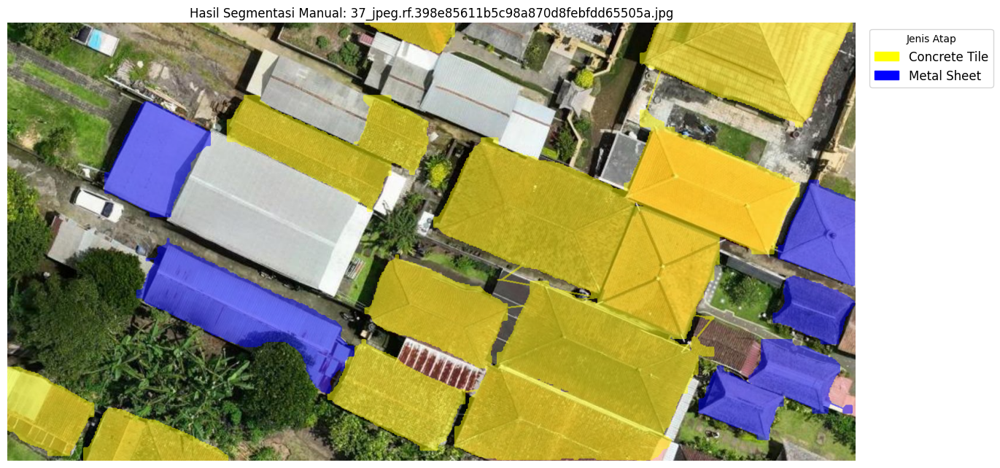


image 1/1 C:\Bisnis AI\Peta ATRBPN\PTNBPR-2\valid\images\42_jpeg.rf.95b5a982177bf9c9d7c1ac88dcf73781.jpg: 448x640 12 concrete_tile_roofs, 3 metal_sheet_roofs, 92.2ms
Speed: 1.9ms preprocess, 92.2ms inference, 13.1ms postprocess per image at shape (1, 3, 448, 640)


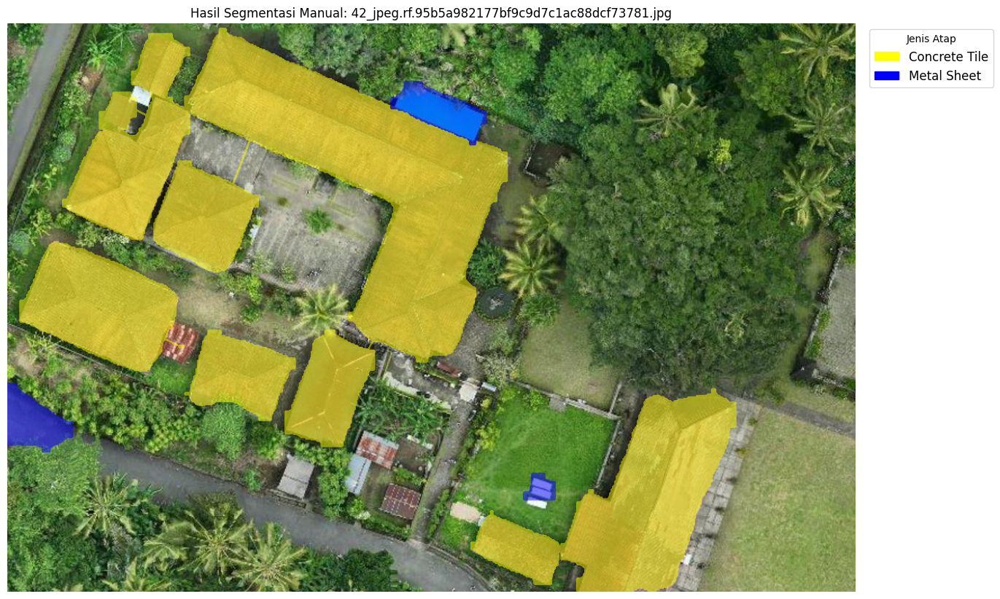


image 1/1 C:\Bisnis AI\Peta ATRBPN\PTNBPR-2\valid\images\50_jpeg.rf.9f637ea42f5678a39814e7cd1e43ac41.jpg: 352x640 5 concrete_tile_roofs, 3 metal_sheet_roofs, 44.2ms
Speed: 1.7ms preprocess, 44.2ms inference, 48.8ms postprocess per image at shape (1, 3, 352, 640)


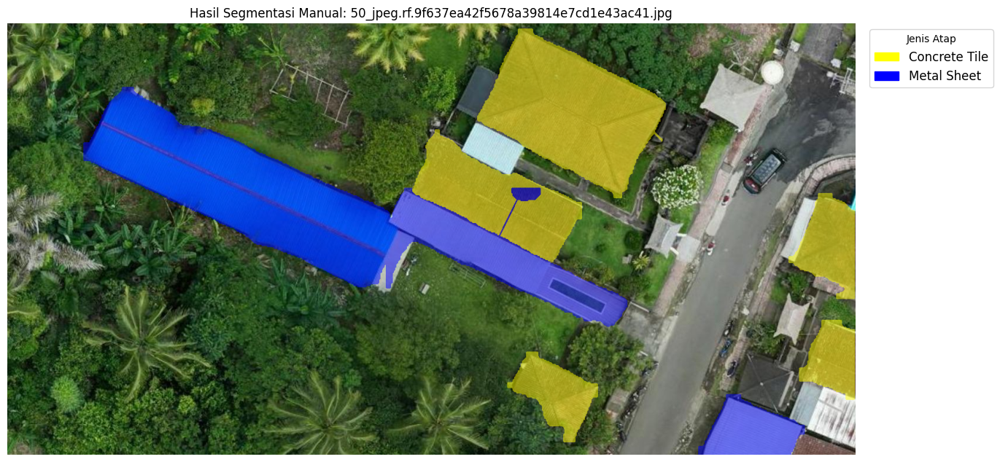

In [25]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from ultralytics import YOLO
import os

# --- KONFIGURASI WARNA MANUAL (BGR untuk OpenCV) ---
# Format: ID_KELAS: (Blue, Green, Red)
# Kita tentukan sendiri warnanya biar tidak berubah-ubah
COLOR_MAP = {
    0: (0, 0, 255),    # asbestos_roof      -> MERAH
    1: (0, 255, 255),  # concrete_tile_roof -> KUNING
    2: (255, 0, 0),    # metal_sheet_roof   -> BIRU
    3: (128, 0, 128)   # roof_temple_black  -> UNGU
}

# Mapping nama untuk legenda (agar rapi)
LABEL_MAP = {
    0: "Asbestos",
    1: "Concrete Tile",
    2: "Metal Sheet",
    3: "Temple/Pura"
}

# 1. Load Model & Gambar
model = YOLO(r"C:\Bisnis AI\Peta ATRBPN\runs\segment\genteng_fix_class\weights\best.pt")
valid_path = r"C:\Bisnis AI\Peta ATRBPN\PTNBPR-2\valid\images"
files = os.listdir(valid_path)[:10]

for f in files:
    img_path = os.path.join(valid_path, f)
    results = model.predict(img_path, conf=0.25)
    
    # Baca gambar asli
    img_original = cv2.imread(img_path)
    img_display = img_original.copy()
    
    # Layer overlay untuk transparansi
    overlay = img_display.copy()
    
    # List untuk menampung kelas apa saja yang muncul di foto ini (untuk legenda)
    detected_classes_in_this_img = set()

    for r in results:
        # Cek apakah ada deteksi
        if r.masks is None:
            continue
            
        # Ambil data masker (polygon) dan kelasnya
        masks = r.masks.xy
        classes = r.boxes.cls.cpu().numpy().astype(int)
        
        # --- GAMBAR MANUAL (LOOP PER OBJEK) ---
        for mask, cls_id in zip(masks, classes):
            detected_classes_in_this_img.add(cls_id)
            
            # Ambil warna dari COLOR_MAP (Default Putih jika error)
            color = COLOR_MAP.get(cls_id, (255, 255, 255))
            
            # Convert polygon ke format integer numpy array
            pts = np.array(mask, np.int32)
            pts = pts.reshape((-1, 1, 2))
            
            # Gambar isi masker (Solid) ke layer overlay
            cv2.fillPoly(overlay, [pts], color)
            
            # (Opsional) Gambar garis pinggir biar tegas
            cv2.polylines(overlay, [pts], True, color, 2)

    # --- CAMPUR GAMBAR ASLI DENGAN WARNA (TRANSPARANSI) ---
    alpha = 0.5 # Tingkat transparansi (0.0 - 1.0)
    cv2.addWeighted(overlay, alpha, img_display, 1 - alpha, 0, img_display)
    
    # --- BUAT LEGENDA ---
    legend_patches = []
    for cls_id in sorted(list(detected_classes_in_this_img)):
        # Ambil warna (BGR) dan convert ke RGB (0-1) untuk Matplotlib
        b, g, r_val = COLOR_MAP.get(cls_id, (255, 255, 255))
        color_rgb = (r_val/255.0, g/255.0, b/255.0)
        
        label_text = LABEL_MAP.get(cls_id, str(cls_id))
        
        patch = mpatches.Patch(color=color_rgb, label=label_text)
        legend_patches.append(patch)

    # --- TAMPILKAN MATPLOTLIB ---
    # Convert Image BGR ke RGB
    img_final_rgb = cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(15, 15))
    plt.imshow(img_final_rgb)
    
    if legend_patches:
        plt.legend(handles=legend_patches, title="Jenis Atap", 
                   loc='upper left', bbox_to_anchor=(1.01, 1), fontsize='large')
    
    plt.axis('off')
    plt.title(f"Hasil Segmentasi Manual: {f}")
    plt.show()